<a href="https://colab.research.google.com/github/prajwal-suresh13/camvid_segmentation/blob/master/segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%load_ext autoreload
%autoreload 2

%matplotlib inline
# %cd /content/gdrive/My Drive/Colab Notebooks/

In [ ]:
#hide
!git clone https://github.com/prajwal-suresh13/dl_lib.git

Cloning into 'dl_lib'...
remote: Enumerating objects: 93, done.
remote: Counting objects: 100% (93/93), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 93 (delta 36), reused 81 (delta 24), pack-reused 0
Unpacking objects: 100% (93/93), done.


In [ ]:
from dl_lib.core.all import *

# Data

In [ ]:
from fastdownload import FastDownload
d = FastDownload()

d.get('https://s3.amazonaws.com/fast-ai-imagelocal/camvid.tgz')

Path('/root/.fastdownload/data/camvid')

In [ ]:
path = Path('/root/.fastdownload/data/camvid')

In [ ]:
path.ls()

[Path('/root/.fastdownload/data/camvid/valid.txt'),
 Path('/root/.fastdownload/data/camvid/images'),
 Path('/root/.fastdownload/data/camvid/codes.txt'),
 Path('/root/.fastdownload/data/camvid/labels')]

In [ ]:
with open(path/'valid.txt','r') as f:
    print(f.readline())
    print(f.readline())

0016E5_07959.png

0016E5_07961.png



In [ ]:
valid_names = (path/'valid.txt').read_text().split('\n')

In [ ]:
len(valid_names) # 101 because there is one more extra space at the end which is also included in list

102

In [ ]:
PIL.Image.open((path/'images').ls()[0]).size

(960, 720)

In [ ]:
PIL.Image.open((path/'labels').ls()[0]).size

(960, 720)

In [ ]:
codes = np.loadtxt(path/'codes.txt', dtype=str); codes

array(['Animal', 'Archway', 'Bicyclist', 'Bridge', 'Building', 'Car',
       'CartLuggagePram', 'Child', 'Column_Pole', 'Fence', 'LaneMkgsDriv',
       'LaneMkgsNonDriv', 'Misc_Text', 'MotorcycleScooter', 'OtherMoving',
       'ParkingBlock', 'Pedestrian', 'Road', 'RoadShoulder', 'Sidewalk',
       'SignSymbol', 'Sky', 'SUVPickupTruck', 'TrafficCone',
       'TrafficLight', 'Train', 'Tree', 'Truck_Bus', 'Tunnel',
       'VegetationMisc', 'Void', 'Wall'], dtype='<U17')

In [ ]:
len(codes) # Void can be ignored

32

In [ ]:
tfms=[MakeRGB(), ResizeFixed(128), to_byte_tensor, to_float_tensor]
il = ImageList.from_folder(path,tfms =tfms, include=['images'])

In [ ]:
valid

ImageList (701 items) 
[Path('/root/.fastdownload/data/camvid/images/0001TP_007620.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f00720.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_07890.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f01980.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f03090.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_08037.png'), Path('/root/.fastdownload/data/camvid/images/0006R0_f03600.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_06990.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_01440.png'), Path('/root/.fastdownload/data/camvid/images/0001TP_007350.png')...]
Path : /root/.fastdownload/data/camvid 
 Transforms : [<dl_lib.core.datablock.MakeRGB object at 0x7fdd9ea23d50>, <dl_lib.core.datablock.ResizeFixed object at 0x7fdd9ea230d0>, <function to_byte_tensor at 0x7fdd9f9dbf80>, <function to_float_tensor at 0x7fdd9f9cc680>]

In [ ]:
sd = SplitData.split_by_func(il, lambda o:True if f'{o.stem}{o.suffix}' in valid_names else False)

In [ ]:
sd

SplitData
Train: ImageList (600 items) 
[Path('/root/.fastdownload/data/camvid/images/0001TP_007620.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f00720.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_07890.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f01980.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f03090.png'), Path('/root/.fastdownload/data/camvid/images/0006R0_f03600.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_06990.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_01440.png'), Path('/root/.fastdownload/data/camvid/images/0001TP_007350.png'), Path('/root/.fastdownload/data/camvid/images/0006R0_f02400.png')...]
Path : /root/.fastdownload/data/camvid 
 Transforms : [<dl_lib.core.datablock.MakeRGB object at 0x7fdd9ea23d50>, <dl_lib.core.datablock.ResizeFixed object at 0x7fdd9ea230d0>, <function to_byte_tensor at 0x7fdd9f9dbf80>, <function to_float_tensor at 0x7fdd9f9cc680>] 
Valid: ImageList (101 items) 

In [ ]:
def to_mask_tensor(x):
    res = torch.ByteTensor(torch.ByteStorage.from_buffer(x.tobytes()))
    w,h = x.size
    res = res.view(h,w,-1).permute(2,0,1)
    return res.type(torch.LongTensor).squeeze(0)

to_mask_tensor._order=40

In [ ]:
ll = label_by_func(sd, lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',y_class=ImageList, y_tfms=[ResizeFixed(128),to_mask_tensor])

In [ ]:
ll

SplitData
Train: LabelData 
x : ImageList (600 items) 
[Path('/root/.fastdownload/data/camvid/images/0001TP_007620.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f00720.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_07890.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f01980.png'), Path('/root/.fastdownload/data/camvid/images/Seq05VD_f03090.png'), Path('/root/.fastdownload/data/camvid/images/0006R0_f03600.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_06990.png'), Path('/root/.fastdownload/data/camvid/images/0016E5_01440.png'), Path('/root/.fastdownload/data/camvid/images/0001TP_007350.png'), Path('/root/.fastdownload/data/camvid/images/0006R0_f02400.png')...]
Path : /root/.fastdownload/data/camvid 
 Transforms : [<dl_lib.core.datablock.MakeRGB object at 0x7fdd9ea23d50>, <dl_lib.core.datablock.ResizeFixed object at 0x7fdd9ea230d0>, <function to_byte_tensor at 0x7fdd9f9dbf80>, <function to_float_tensor at 0x7fdd9f9cc680>] 
y : ImageList 

In [ ]:
data = ll.to_databunch(ll, 4, c_in=3, c_out=32)

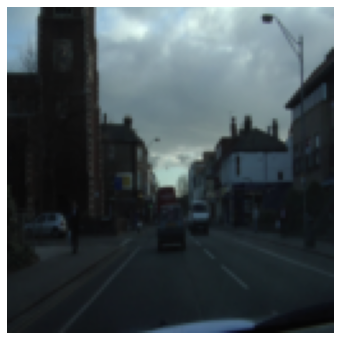

In [ ]:
ll.train[0][0].show()

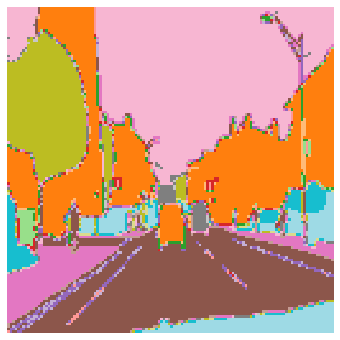

In [ ]:
ll.train[0][1].show(vmin=1,vmax=31)

# Unet

In [ ]:
ifnone=lambda a,b:b if a is None else a

In [ ]:
def hook_outputs(hook, mod, inp, outp):
    hook.output = outp

In [ ]:
def icnr_init(x, scale=2, init=nn.init.kaiming_normal_):
    "ICNR init of `x`, with `scale` and `init` function"
    ni,nf,h,w = x.shape
    ni2 = int(ni/(scale**2))
    k = init(x.new_zeros([ni2,nf,h,w])).transpose(0, 1)
    k = k.contiguous().view(ni2, nf, -1) 
    #https://stackoverflow.com/questions/48915810/what-does-contiguous-do-in-pytorch
    k = k.repeat(1, 1, scale**2) # repeat on the mentioned dim
    k = k.contiguous().view([nf,ni,h,w]).transpose(0, 1)
    return k

In [ ]:
class PixelShuffle_ICNR(nn.Sequential):
    def __init__(self, ni, nf=None, scale=2, blur=False):
        super().__init__()
        nf = ifnone(nf, ni)
        layers = [conv_layer(ni, nf*(scale**2), ks=1, stride=1), nn.PixelShuffle(scale)]
        layers[0][0].weight.data.copy_(icnr_init(layers[0][0].weight.data))
        if blur: layers+=[nn.ReflectionPad2d((1,0,1,0)), nn.AvgPool2d(2,stride=1)]
        super().__init__(*layers)

In [ ]:
def double_conv_max(n_in, n_out, ks=3, stride=1, maxpool=True):
    layers = [conv_layer(n_in, n_out, ks=ks, stride=stride), conv_layer(n_out, n_out,ks=ks, stride=stride)]
    if maxpool: layers+=[nn.MaxPool2d(kernel_size=2, stride=2)]
    return nn.Sequential(*layers)

In [ ]:
class UnetBlock(nn.Module):
    def __init__(self, up_in_c, x_in_c):
        super().__init__()
        self.shuf = PixelShuffle_ICNR(up_in_c, up_in_c//2)
        self.bn = nn.BatchNorm2d(x_in_c)
        ni = up_in_c//2 + x_in_c
        nf = ni//2
        self.double_conv = double_conv_max(ni,nf, maxpool=False)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, up_in, hook):
        up_out = self.shuf(up_in)
        # print(up_out.shape)
        hook = hook
        # print(hook.shape)
        if hook.shape[-2:]!=up_out.shape[-2:]:
            up_out = F.interpolate(up_out, hook.shape[-2:], mode='nearest')
        cat = self.relu(torch.cat([up_out, self.bn(hook)],dim=1))
        return self.double_conv(cat)


In [ ]:
class UNet(nn.Module):
    def __init__(self, input_channels, output_channels):
        super().__init__()
        self.input_channels, self.output_channels =input_channels, output_channels
        filters =[self.input_channels, 64, 128, 256, 512,1024]

        encoder_layers = [double_conv_max(filters[i],filters[i+1]) for i in range(4)]
        self.encoder = nn.Sequential(*encoder_layers)
        self.blocks = [enc[1] for enc in self.encoder]


        self.mid_layers = double_conv_max(filters[-2],filters[-1],maxpool=False) 

        filters = list(reversed(filters))
        decoder_layers = [UnetBlock(filters[i],filters[i+1]) for i in range(4)]
        self.decoder = nn.Sequential(*decoder_layers)
        

        self.output_layer = nn.Conv2d(in_channels=64, out_channels= self.output_channels, kernel_size=1)

    def forward(self, image):
        with Hooks(self.blocks, hook_outputs) as hooks:
            x = self.encoder(image)
            self.hooks = [o.output for o in hooks]
        # print(x.shape)
        # for h in self.hooks: print(h.shape)

        self.hooks = list(reversed(self.hooks))

        x = self.mid_layers(x)
        # print(x.shape)

        for layer,h in zip(self.decoder, self.hooks):
            x = layer(x, h)
            # print(x.shape)
        x = self.output_layer(x)
        # print(x.shape)
        return x

# Metrics

In [ ]:
name2id = {v:k for k,v in enumerate(codes)}
void_code = name2id['Void']

def acc_camvid(input, target):
    n=target.shape[0]
    target = target.view(n,-1)
    input = input.argmax(dim=1).view(n,-1)
    mask = target != void_code
    return (input[mask]==target[mask]).float().mean()

In [ ]:
class CrossEntropyFlat(nn.CrossEntropyLoss):
    def forward(self, input, target):
        n,c,*_ = input.shape
        return super().forward(input.view(n,c,-1), target.view(n,-1))
        #https://discuss.pytorch.org/t/multi-class-semantic-segmentation-using-u-net-error-with-binary-cross-entropy-with-logits/85207

In [ ]:
def show_results(learn, num_of_outputs=5, valid=False,vmin=1,vmax=31):
    columns=3
    total = num_of_outputs*columns
    rows = num_of_outputs
    fig,axes = plt.subplots(rows,columns,figsize=(columns*10,rows*10))
    i=0
    dl = learn.data.valid_dl if valid else learn.data.train_dl
    for xb,yb in dl:
        for x,y in zip(xb,yb):
            show_image(x, axes.flat[i],figsize=(32,32),title='Input')
            i+=1
            show_image(y, axes.flat[i],figsize=(32,32),title='Target',vmin=vmin, vmax=vmax)
            i+=1
            
            show_image(learn.model.cpu()(x.unsqueeze(0)).argmax(dim=1).squeeze(0), axes.flat[i],figsize=(32,32),title='Prediction',vmin=vmin,vmax=vmax)
            i+=1

            if i==total:return

            

#Training 


##128x128

In [ ]:
tfms=[MakeRGB(), ResizeFixed(128), to_byte_tensor, to_float_tensor]
il = ImageList.from_folder(path,tfms =tfms, include=['images'])
sd = SplitData.split_by_func(il, lambda o:True if f'{o.stem}{o.suffix}' in valid_names else False)
ll = label_by_func(sd, lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',y_class=ImageList, y_tfms=[ResizeFixed(128),to_mask_tensor])
data = ll.to_databunch(ll, 4, c_in=3, c_out=32)

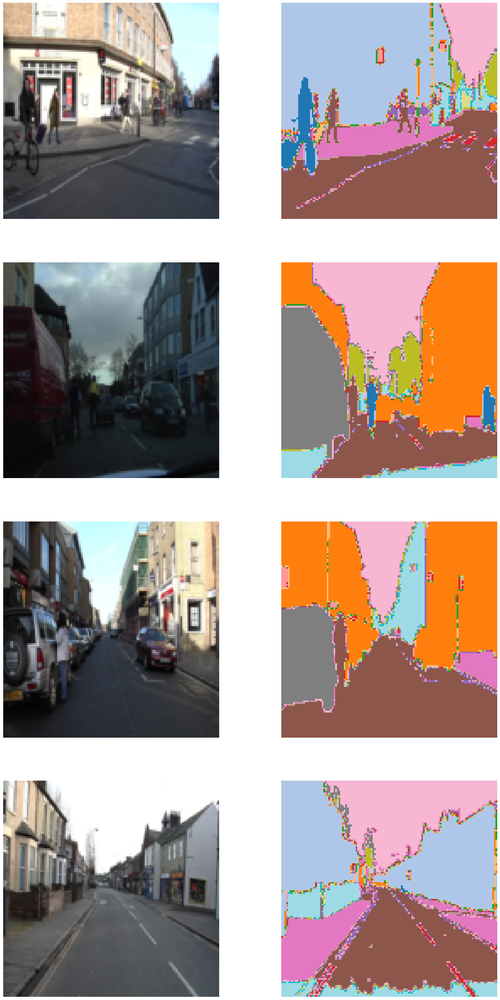

In [ ]:
show_img2img_batch(data.train_dl, vmin=1, vmax=31)

In [ ]:
loss_func = CrossEntropyFlat()

In [ ]:
cbfs =[partial(AvgStatsCallback,[acc_camvid]), ProgressbarCallback, CudaCallback, Recorder]

In [ ]:
learn = Learner(UNet(3,32), data, loss_func, opt_func=lamb_opt(), lr=1e-3,cbfuncs=cbfs)

In [ ]:
learn.fit(10,cbs=[LR_Find()])

epoch,train_loss,train_acc_camvid,valid_loss,valid_acc_camvid,time


/content/dl_lib/core/optimizers.py:104: UserWarning: This overload of addcmul_ is deprecated:
	addcmul_(Number value, Tensor tensor1, Tensor tensor2)
Consider using one of the following signatures instead:
	addcmul_(Tensor tensor1, Tensor tensor2, *, Number value) (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:1174.)
  state['sqr_grad_avg'].mul_(sqr_mom).addcmul_(state['sqr_mom_damp'], p.grad.data, p.grad.data)


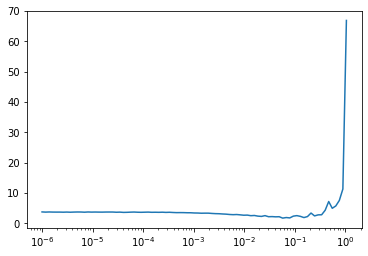

In [ ]:
learn.recorder.plot()

In [ ]:
param = sched_1cycle([5e-2])

In [ ]:
Learner??

In [ ]:
learn = Learner(UNet(3,32), data, loss_func, opt_func=lamb_opt(),cbfuncs=cbfs,plot_hypers=['lr','mom'])
learn.fit(30,cbs=param)

epoch,train_loss,train_acc_camvid,valid_loss,valid_acc_camvid,time
0,1.702612,0.618005,1.645390,0.582058,00:34
1,1.279563,0.682835,1.642193,0.546602,00:33
2,1.273602,0.684296,1.989753,0.468256,00:33
3,1.323939,0.674312,1.677439,0.573956,00:33
4,1.395757,0.646569,2.163891,0.439334,00:33
5,1.376560,0.657325,1.575556,0.575914,00:33
6,1.343387,0.667750,1.573746,0.619674,00:33
7,1.340047,0.673962,1.668900,0.637944,00:33
8,1.364297,0.671464,1.853162,0.542287,00:33
9,1.367236,0.677879,1.384975,0.675764,00:33


In [ ]:
torch.save(learn.model.state_dict(),'/content/gdrive/My Drive/Colab Notebooks/camvid_segmentation/model/128_30epochs.pth')

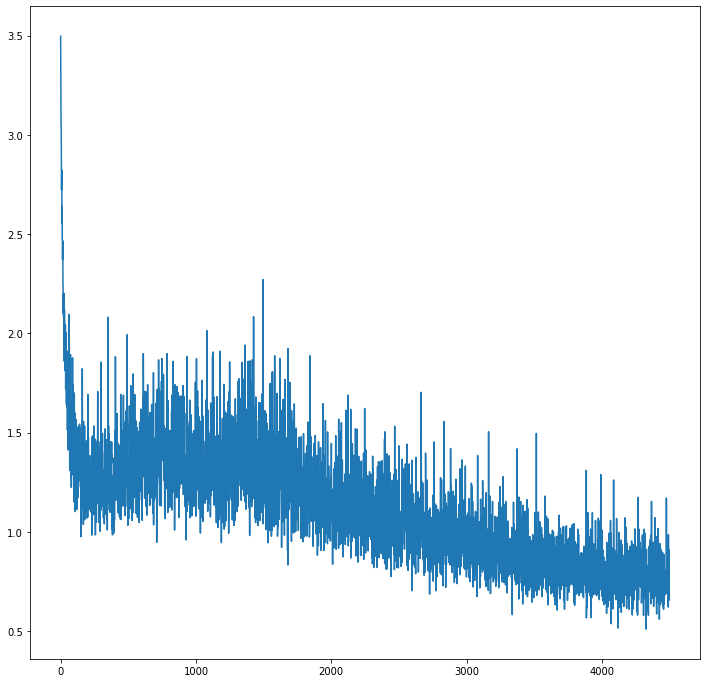

In [ ]:
learn.recorder.plot_loss()

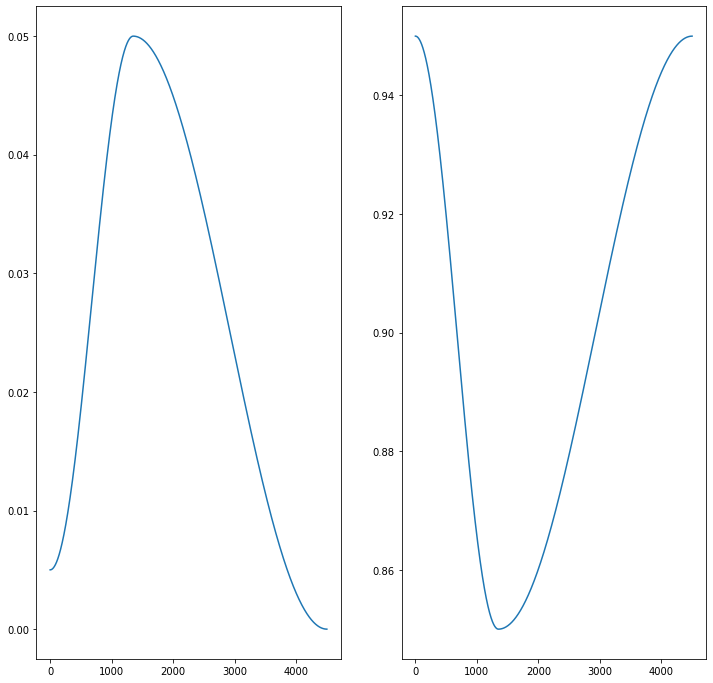

In [ ]:
learn.recorder.plot_hypers()

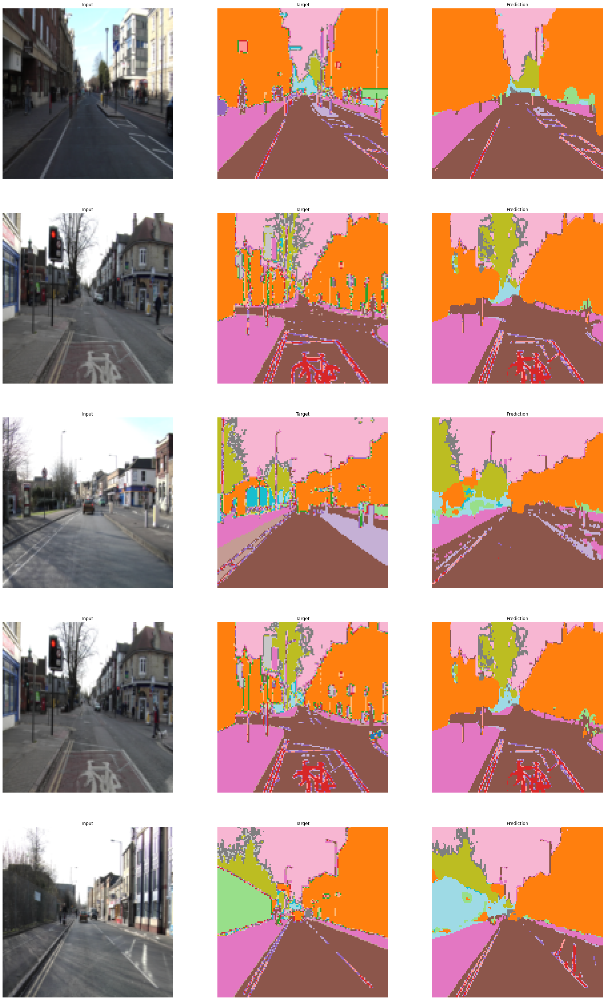

In [ ]:
show_results(learn)

##256x256

In [ ]:
tfms=[MakeRGB(), ResizeFixed(256), to_byte_tensor, to_float_tensor]
il = ImageList.from_folder(path,tfms =tfms, include=['images'])
sd = SplitData.split_by_func(il, partial(random_splitter, p_valid=0.3))
ll = label_by_func(sd, lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',y_class=ImageList, y_tfms=[ResizeFixed(256),to_mask_tensor])
data = ll.to_databunch(ll, 4, c_in=3, c_out=32)

In [ ]:
param = sched_1cycle([5e-3])

In [ ]:
learn.data = data

In [ ]:
learn.fit(30,cbs=param)

epoch,train_loss,train_acc_camvid,valid_loss,valid_acc_camvid,time
0,1.138855,0.745362,0.923695,0.782438,00:43
1,0.912294,0.784579,0.846316,0.800369,00:43
2,0.856406,0.796632,0.806587,0.808761,00:43
3,0.817520,0.803783,0.802235,0.808858,00:44
4,0.792240,0.810185,0.772791,0.814388,00:43
5,0.771095,0.813547,0.750313,0.820860,00:43
6,0.755005,0.816781,0.736542,0.825270,00:43
7,0.741348,0.819675,0.731287,0.825135,00:43
8,0.732750,0.821853,0.725884,0.824041,00:43
9,0.715448,0.825567,0.735536,0.820921,00:43


In [ ]:
torch.save(learn.model.state_dict(),'/content/gdrive/My Drive/Colab Notebooks/camvid_segmentation/model/256_30epochs.pth')

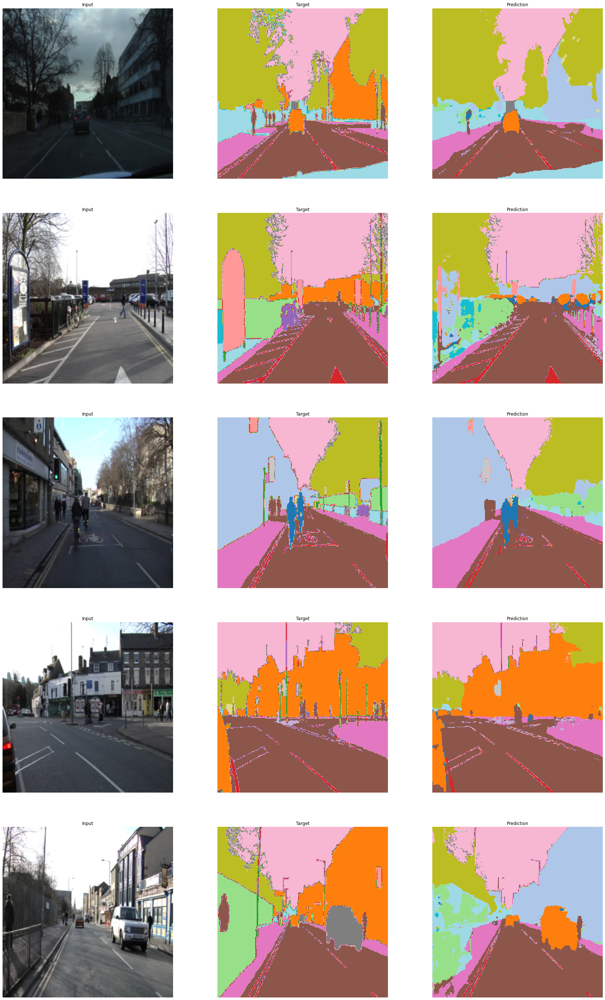

In [ ]:
show_results(learn)

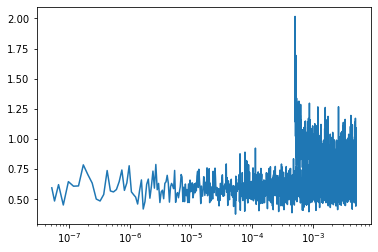

In [ ]:
learn.recorder.plot()

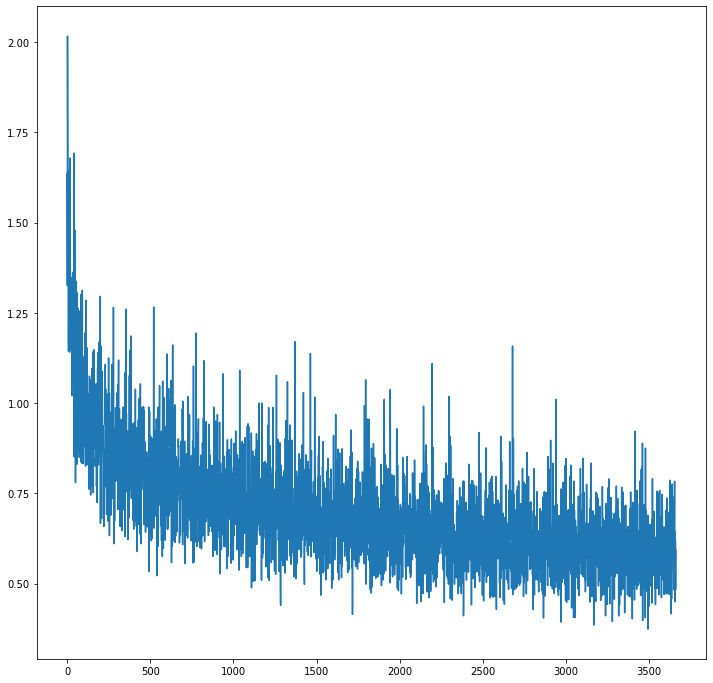

In [ ]:
learn.recorder.plot_loss()

##512x512

In [ ]:
tfms=[MakeRGB(), ResizeFixed(512), to_byte_tensor, to_float_tensor]
il = ImageList.from_folder(path,tfms =tfms, include=['images'])
sd = SplitData.split_by_func(il, partial(random_splitter, p_valid=0.3))
ll = label_by_func(sd, lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',y_class=ImageList, y_tfms=[ResizeFixed(512),to_mask_tensor])
data = ll.to_databunch(ll, 4, c_in=3, c_out=32)

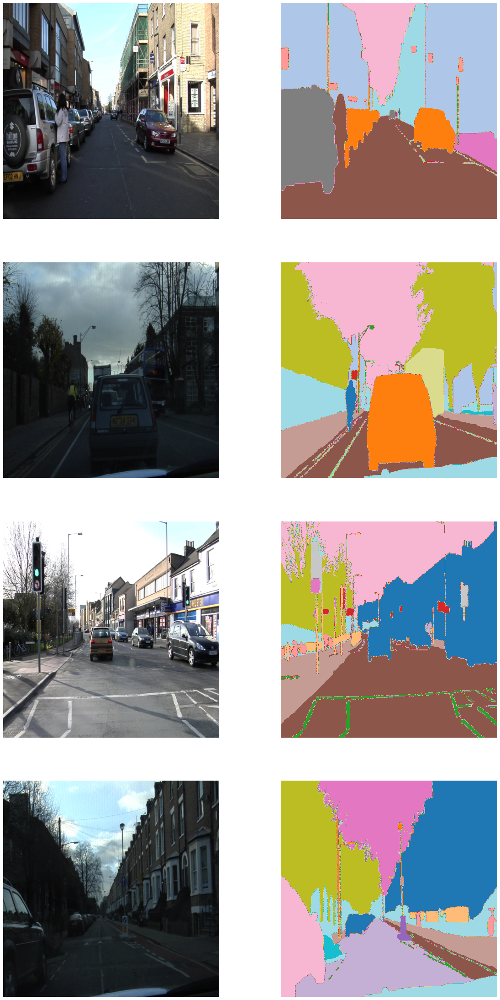

In [ ]:
show_img2img_batch(data.train_dl)

In [ ]:
cbfs =[partial(AvgStatsCallback,[acc_camvid]), ProgressbarCallback, CudaCallback, Recorder]
loss_func = CrossEntropyFlat()

In [ ]:
param = sched_1cycle([1e-4])

In [ ]:
learn = Learner(UNet(3,32), data, loss_func, opt_func=lamb_opt(), lr=1e-3,cbfuncs=cbfs)

learn.model.load_state_dict(torch.load('/content/gdrive/My Drive/Colab Notebooks/camvid_segmentation/model/256_30epochs.pth'))

<All keys matched successfully>

In [ ]:
learn.fit(5,cbs=[LR_Find()])

epoch,train_loss,train_acc_camvid,valid_loss,valid_acc_camvid,time


/content/dl_lib/core/optimizers.py:104: UserWarning: This overload of addcmul_ is deprecated:
	addcmul_(Number value, Tensor tensor1, Tensor tensor2)
Consider using one of the following signatures instead:
	addcmul_(Tensor tensor1, Tensor tensor2, *, Number value) (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:1174.)
  state['sqr_grad_avg'].mul_(sqr_mom).addcmul_(state['sqr_mom_damp'], p.grad.data, p.grad.data)


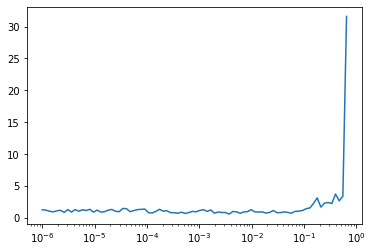

In [ ]:
learn.recorder.plot()

In [ ]:
learn = None
torch.cuda.empty_cache()

In [ ]:
param = sched_1cycle([1e-2])
learn = Learner(UNet(3,32), data, loss_func, opt_func=lamb_opt(),cbfuncs=cbfs, plot_hypers=['lr','mom'])
learn.model.load_state_dict(torch.load('/content/gdrive/My Drive/Colab Notebooks/camvid_segmentation/model/256_30epochs.pth'))

<All keys matched successfully>

In [ ]:
learn.fit(30, cbs=param)

epoch,train_loss,train_acc_camvid,valid_loss,valid_acc_camvid,time
0,0.765177,0.822064,0.719020,0.831196,01:36
1,0.682607,0.839002,0.700927,0.837644,01:36
2,0.665180,0.842888,0.676734,0.840439,01:35
3,0.656817,0.845743,0.671405,0.844446,01:35
4,0.656372,0.845368,0.679810,0.842398,01:35
5,0.652141,0.845972,0.680618,0.839844,01:35
6,0.627390,0.852561,0.662206,0.848726,01:35
7,0.631295,0.852675,0.715295,0.830394,01:36
8,0.618266,0.854440,0.654596,0.850290,01:35
9,0.597918,0.858918,0.672547,0.844092,01:36


In [ ]:
torch.save(learn.model.state_dict(),'/content/gdrive/My Drive/Colab Notebooks/camvid_segmentation/model/512_30epochs.pth')

In [ ]:
show_results??

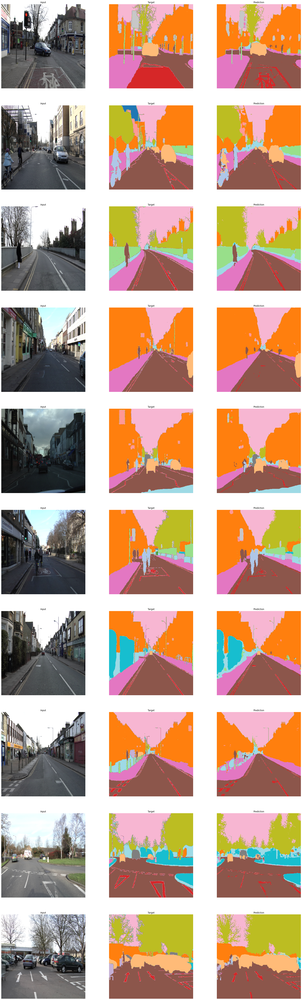

In [ ]:
show_results(learn,num_of_outputs=10,vmin=0,vmax=31)